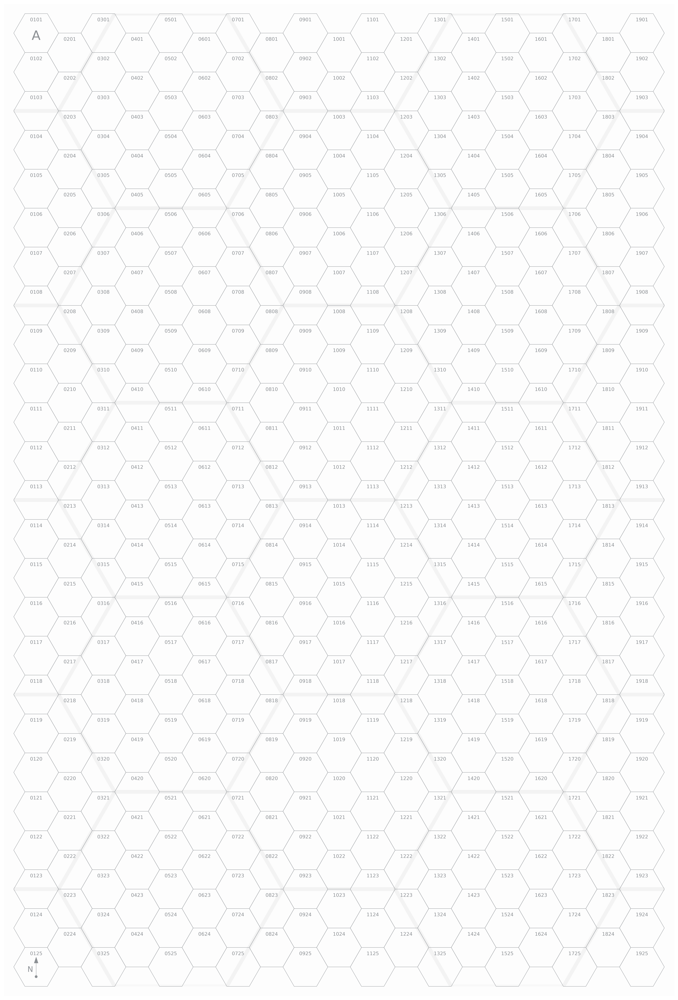

In [14]:
import sys

sys.path.append("../../glass/src")
from glass import *
import os

dotsperhex = 300

startgamesetup(
    None,
    sheets=[["A"]],
    style="frozenwater",
    dotsperhex=dotsperhex,
    printlog=False,
    writelogfiles=False,

)
drawmap(zoom=False)
os.rename("map-00.png", "white.png")

In [15]:
from PIL import Image

def blend(sheet, ll, lr, ul, ur):

    glassimage = Image.open("../../glass/maps/map-sheet-%s.png" % sheet)
    #glassimage = Image.open("white.png")
    glassimage = glassimage.convert(mode="RGB")

    if sheet in "EFGHIJ":
        scannedimage = Image.open(
            "../../air-power-notes/Maps/Air Strike — Map Sheet %s.jpg" % sheet
        )
    elif sheet in "KLN":
        scannedimage = Image.open(
            "../../air-power-notes/Maps/Eagles of the Gulf — Map Sheet %s.png" % sheet
        )
    scannedimage = scannedimage.convert(mode="RGB")

    # adjust origins
    ll = (ll[0], scannedimage.height - ll[1])
    lr = (scannedimage.width - lr[0], scannedimage.height - lr[1])
    ur = (scannedimage.width - ur[0], ur[1])

    scannedimage = scannedimage.transform(glassimage.size, Image.Transform.QUAD, ul + ll + lr + ur)

    blendedimage = Image.blend(glassimage, scannedimage, 0.2)
    blendedimage = blendedimage.crop((0, 19, blendedimage.width - 0, blendedimage.height - 19))
    blendedimage.save("blend-%s.png" % sheet)

    whiteimage = Image.new("RGB", scannedimage.size, "white")
    blendedimage = Image.blend(scannedimage, whiteimage, 0.5)
    blendedimage = blendedimage.crop((0, 19, blendedimage.width - 0, blendedimage.height - 19))
    blendedimage.save("scanned-%s.png" % sheet)



In [16]:
# ll, lr, ul, ur
blend("E", (-45, -165), (-30, -190), (-30, -145), (-20, -110))

In [17]:
blend("F", (-50, -110), (-40, -190), (+20, -160), (-100, -100))

In [18]:
blend("G", (-0, -170), (-10, -205), (+5, -105), (-5, -85))

In [19]:
blend("H", (-60, -195), (-35, -200), (-55, -130), (-40, -95))

In [20]:
blend("I", (0, -140), (-30, -185), (0, -120), (-30, -90))

In [21]:
blend("J", (-35, -130), (-50, -150), (-35, -135), (-50, -100))

In [22]:
blend("K", (-0, -11), (11, -21), (-0, -25), (2, -20))

In [23]:
blend("L", (2, -18), (8, -21), (-0, -25), (5, -20))

In [24]:
blend("N", (0, 13), (-1, 12), (7, -35), (-9, -31))

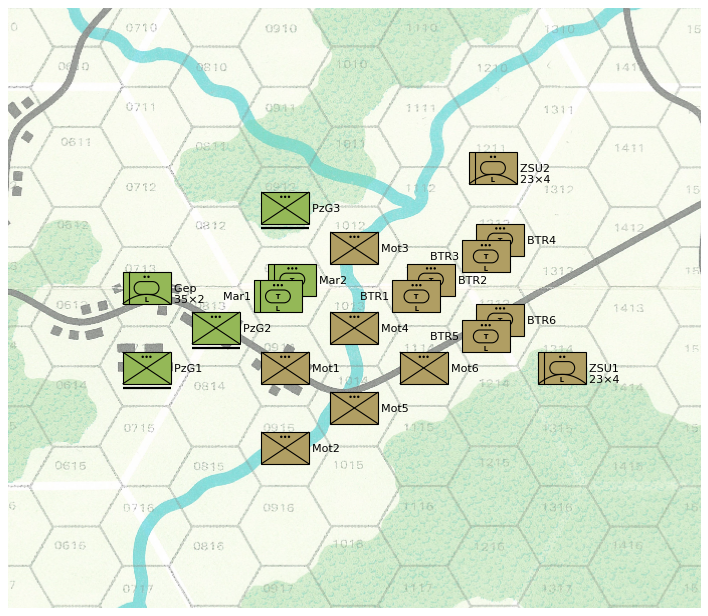

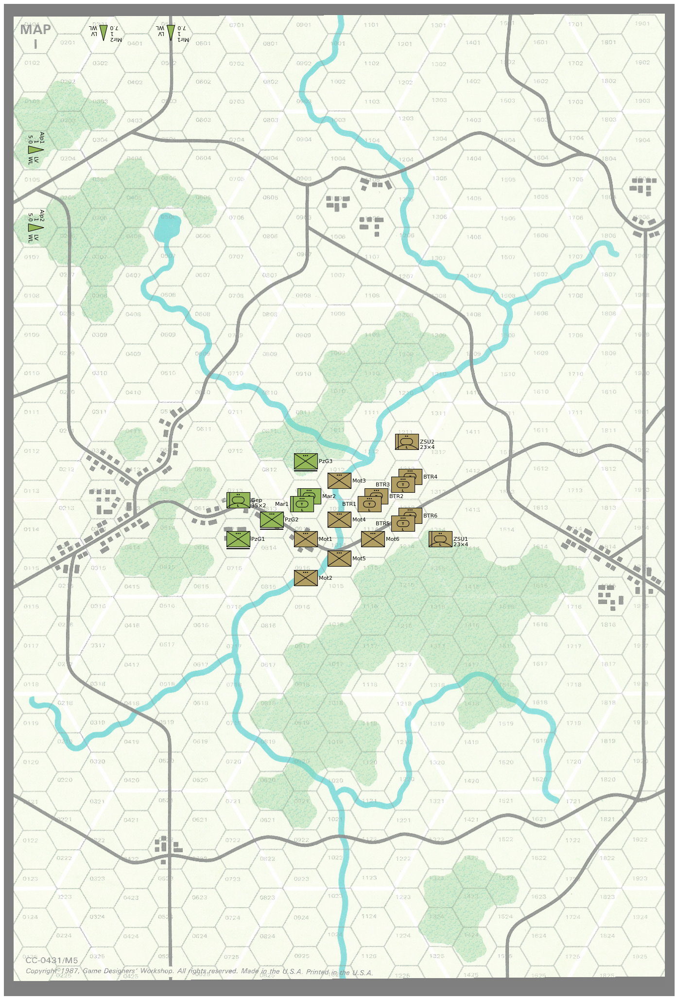

In [25]:
import sys

sys.path.append("../../glass/src")
from glass import *
import os

startgamesetup(
    None,
    sheets=[["I"]],
    dotsperhex=80,
    printlog=False,
    writelogfiles=False,
    imagepath="scanned-I.png",
)

natogroundunitcolor="airstrikelightgreen"
wpgroundunitcolor="airstriketan"

setupgroundunit(
    "PzG1",
    "I-0714",
    type="infantry platoon",
    stack="1/1",
    color=natogroundunitcolor,
    protectionclass="entrenched",
)
setupgroundunit(
    "PzG2",
    "I-0813",
    type="infantry platoon",
    stack="1/1",
    color=natogroundunitcolor,
    protectionclass="entrenched",
)
setupgroundunit(
    "PzG3",
    "I-0912",
    type="infantry platoon",
    stack="1/1",
    color=natogroundunitcolor,
    protectionclass="entrenched",
)
setupgroundunit(
    "Mar1", "I-0913", type="light IFV platoon", stack="1/2", color=natogroundunitcolor
)
setupgroundunit(
    "Mar2", "I-0913", type="light IFV platoon", stack="2/2", color=natogroundunitcolor
)
setupgroundunit(
    "Gep",
    "I-0713",
    type="Gepard section",
    stack="1/1",
    color=natogroundunitcolor,
)

setupgroundunit("Mot1", "I-0914", type="infantry platoon", stack="1/1", color=wpgroundunitcolor)
setupgroundunit("Mot2", "I-0915", type="infantry platoon", stack="1/1", color=wpgroundunitcolor)
setupgroundunit("Mot3", "I-1012", type="infantry platoon", stack="1/1", color=wpgroundunitcolor)
setupgroundunit("Mot4", "I-1013", type="infantry platoon", stack="1/1", color=wpgroundunitcolor)
setupgroundunit("Mot5", "I-1014", type="infantry platoon", stack="1/1", color=wpgroundunitcolor)
setupgroundunit("Mot6", "I-1114", type="infantry platoon", stack="1/1", color=wpgroundunitcolor)
setupgroundunit(
    "BTR1",
    "I-1113",
    type="light APC platoon",
    stack="1/2",
    color=wpgroundunitcolor,
)
setupgroundunit(
    "BTR2",
    "I-1113",
    type="light APC platoon",
    stack="2/2",
    color=wpgroundunitcolor,
)
setupgroundunit(
    "BTR3",
    "I-1212",
    type="light APC platoon",
    stack="1/2",
    color=wpgroundunitcolor,
)
setupgroundunit(
    "BTR4",
    "I-1212",
    type="light APC platoon",
    stack="2/2",
    color=wpgroundunitcolor,
)
setupgroundunit(
    "BTR5",
    "I-1213",
    type="light APC platoon",
    stack="1/2",
    color=wpgroundunitcolor,
)
setupgroundunit(
    "BTR6",
    "I-1213",
    type="light APC platoon",
    stack="2/2",
    color=wpgroundunitcolor,
)
setupgroundunit(
    "ZSU1",
    "I-1314",
    type="ZSU-23-4 section",
    stack="1/1",
    color=wpgroundunitcolor,
)
setupgroundunit(
    "ZSU2",
    "I-1211",
    type="ZSU-23-4 section",
    stack="1/1",
    color="airstriketan",
)

drawmap(zoom=True, allidentified=True)

Mir1 = setupaircraft(
    "Mir1",
    "NATO",
    "Mirage 5BA",
    "I-0501",
    "S",
    1,
    7.0,
    color=natogroundunitcolor,
    fuel=340,
    bingofuel=180,
    stores={
        "1": "BB/AP/Cluster/550",
        "2": "FT/MRT/500L",
        "2a": "BB/HE/550",
        "2b": "BB/HE/550",
        "3a": "BB/AT/Cluster/650",
        "3b": "BB/AT/Cluster/650",
        "6": "FT/MRT/500L",
        "6a": "BB/HE/550",
        "6b": "BB/HE/550",
        "7": "BB/AP/Cluster/550",
    },
)

Mir2 = setupaircraft(
    "Mir2",
    "NATO",
    "Mirage 5BA",
    "I-0301",
    "S",
    1,
    7.0,
    color=natogroundunitcolor,
    fuel=340,
    bingofuel=180,
    stores={
        "1": "BB/AP/Cluster/550",
        "2": "FT/MRT/500L",
        "2a": "BB/HE/550",
        "2b": "BB/HE/550",
        "3a": "BB/AT/Cluster/650",
        "3b": "BB/AT/Cluster/650",
        "6": "FT/MRT/500L",
        "6a": "BB/HE/550",
        "6b": "BB/HE/550",
        "7": "BB/AP/Cluster/550",
    },
)

Alp1 = setupaircraft(
    "Alp1",
    "NATO",
    "Alpha Jet A",
    "I-0104",
    "E",
    1,
    5.0,
    color=natogroundunitcolor,
    fuel=100,
    bingofuel=38,
    stores={
        "1": "IRM/R.550 Magic I",
        "2": "WR/DR",
        "2a": "BB/HE/550",
        "2b": "BB/HE/550",
        "3": "GP/27 mm Mauser",
        "4": "WR/DR",
        "4a": "BB/HE/550",
        "4b": "BB/HE/550",
        "5": "IRM/R.550 Magic I",
    },
)

Alp2 = setupaircraft(
    "Alp2",
    "NATO",
    "Alpha Jet A",
    "I-0106",
    "E",
    1,
    5.0,
    color=natogroundunitcolor,
    fuel=100,
    bingofuel=38,
    stores={
        "1": "IRM/R.550 Magic I",
        "2": "WR/DR",
        "2a": "BB/HE/550",
        "2b": "BB/HE/550",
        "3": "GP/27 mm Mauser",
        "4": "WR/DR",
        "4a": "BB/HE/550",
        "4b": "BB/HE/550",
        "5": "IRM/R.550 Magic I",
    },
)

drawmap(zoom=False, allidentified=True)

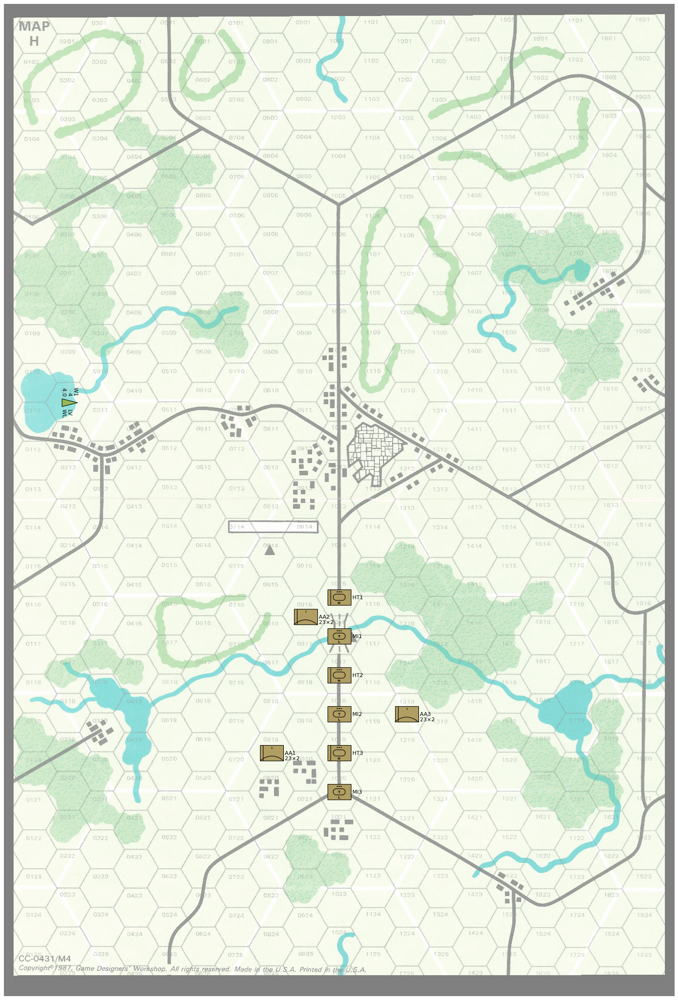

In [26]:
startgamesetup(
    None,
    sheets=[["H"]],
    variants=["use version 2.4 rules", "use house rules", "use optional damage table"],
    imagepath="scanned-H.png",
    dotsperhex=80,
    printlog=False,
    writelogfiles=False,
)
W1 = setupaircraft(
    "W1", "USAF", "A-10A", "H-0210", "E", 4, 4.0, color="airstrikelightgreen", stores={}
)

HT1 = setupgroundunit(
    "HT1", "H-1015", "heavy tank platoon", color="airstriketan", stack="1/1"
)
HT2 = setupgroundunit(
    "HT2", "H-1017", "heavy tank platoon", color="airstriketan", stack="1/1"
)
HT3 = setupgroundunit(
    "HT3", "H-1019", "heavy tank platoon", color="airstriketan", stack="1/1"
)
MI1 = setupgroundunit(
    "MI1", "H-1016", "light APC platoon", color="airstriketan", stack="1/1"
)
MI2 = setupgroundunit(
    "MI2", "H-1018", "light APC platoon", color="airstriketan", stack="1/1"
)
MI3 = setupgroundunit(
    "MI3", "H-1020", "light APC platoon", color="airstriketan", stack="1/1"
)

# AA1 = setupgroundunit("AA1", "H-1016", "ZSU-23-4 section", color="airstriketan", stack="1/2")
# AA2 = setupgroundunit("AA2", "H-1018", "ZSU-23-4 section", color="airstriketan", stack="1/2")

AA1 = setupgroundunit("AA1", "H-0819", "ZU-23 battery", color="airstriketan")
AA2 = setupgroundunit("AA2", "H-0916", "ZU-23 battery", color="airstriketan")
AA3 = setupgroundunit("AA3", "H-1218", "ZU-23 battery", color="airstriketan")

drawmap(zoom=False, allidentified=True)

In [ ]:
!rm glass.pickle map-00.png moves.txt white.png